# 2023C2: Plotting SST1 RSoXS Data

## Imports

In [33]:
!pip install -e /nsls2/users/alevin/repos/PyHyperScattering  # to use pip to install via directory

Obtaining file:///nsls2/users/alevin/repos/PyHyperScattering
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for PyHyperScattering (pyproject.toml) ... done
  Created wheel for PyHyperScattering: filename=PyHyperScattering-0.2.1+37.gac1f562-0.editable-py3-none-any.whl size=5355 sha256=ecce2632a3d777b703d4b179c7ec45afd7582efe16aad5cb7a8fae2c035840ff
  Stored in directory: /tmp/pip-ephem-wheel-cache-3kvc44o9/wheels/7d/89/c7/db1d0cb1cf714f3a03a438abee7b78ce09921efd15259b1f5f
Successfully built PyHyperScattering
  Attempting uninstall: PyHyperScattering
    Found existing installation: PyHyperScattering 0.2.1+37.gac1f562
    Uninstalling PyHyperScattering-0.2.1+37.gac1f562:
      Successfully uninstalled PyHyperScattering-0.2.1+37.gac1f562


In [1]:
## Imports
import PyHyperScattering as phs
import pathlib
import sys
import io
import ast
import json
import datetime
import dask.array as da
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from tqdm.auto import tqdm
import dask.array as da
from tiled.client import from_profile, from_uri
import subprocess


print(f'Using PyHyperScattering Version: {phs.__version__}')

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


Using PyHyperScattering Version: 0.2.1+37.gac1f562


## Define Paths

In [2]:
def make_para_perp_DAs(datasets, sample_name, edge, intensity_type, pol, qlims, chi_width):
    # select dataarray to plot
    DS = datasets[f'polar_{edge}']
    DA = DS.sel(sample_name=sample_name)[f'{intensity_type}_intensity']
    sliced_DA = DA.sel(polarization=pol, q=slice(qlims[0],qlims[1]))

    # calculate ISI dataarrays
    if pol==0:
        para_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
        perp_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))
    elif pol==90:
        perp_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
        para_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))   
        
    return para_DA, perp_DA

In [3]:
## Define directory paths
userPath = pathlib.Path('/nsls2/users/alevin')
propPath = pathlib.Path('/nsls2/data/sst/proposals/2023-3/pass-313412')

outPath = propPath.joinpath('processed_data')
plotsPath = outPath.joinpath('prsoxs_plots')
# jsonPath = outPath.joinpath('local_config')
maskPath = outPath.joinpath('masks')
zarrsPath = outPath.joinpath('zarrs')


# propPath = pathlib.Path('/nsls2/data/sst/proposals/2022-2/pass-309180')
# zarrsPath = propPath.joinpath('zarr_datasets_jul2022')
# outPath = propPath.joinpath('processed_data')
# plotsPath = outPath.joinpath('prsoxs_plots')

## Load DataArrays 

In [4]:
sorted([f.name for f in zarrsPath.glob('*')])

['.ipynb_checkpoints',
 'TEY_nexafs_carbon.zarr',
 'TEY_nexafs_nitrogen.zarr',
 'cartesian_rsoxs_carbon_day1.zarr',
 'cartesian_rsoxs_nitrogen_day1.zarr',
 'polar_rsoxs_carbon_day1.zarr',
 'polar_rsoxs_nitrogen_day1.zarr']

In [9]:
# DAs_list = []
# for zarrPath in zarrsPath.glob('raw*WA*'):
#     DA = xr.open_zarr(zarrPath)
#     DAs_list.append(DA)
    
# DAs_list[0]

In [8]:
# DAs_list[2]['waxs'].blend_name

In [5]:
# load dictionary of rsoxs datasets
rsoxs_datasets = {}
for key in ['cartesian_carbon', 'cartesian_nitrogen', 'polar_carbon', 'polar_nitrogen']:
    key_start = key.split('_')[0]
    key_end = key.split('_')[1]        
    zarrPath = list(zarrsPath.glob(f'{key_start}*{key_end}_day1.zarr'))[0]
    rsoxs_datasets[key] = xr.open_zarr(zarrPath)
    
    # Compute any dask coordiantes
    for coord_name, coord_data in rsoxs_datasets[key].coords.items():
        if isinstance(coord_data.data, da.Array):
            rsoxs_datasets[key].coords[coord_name] = coord_data.compute()
    
    # # Add bare SiN substrate subtracted data variables if necessary
    # if key_start == 'cartesian':
    #     DS = rsoxs_datasets[key]
    #     DS['sin_sub_raw_intensity'] = DS['raw_intensity'] - DS['raw_intensity'].sel(sample_name='BareSiN')
    #     DS['sin_sub_corr_intensity'] = DS['corr_intensity'] - DS['corr_intensity'].sel(sample_name='BareSiN')
    #     rsoxs_datasets[key] = DS

In [6]:
rsoxs_datasets['cartesian_nitrogen']

<xarray.Dataset>
Dimensions:         (energy: 57, polarization: 2, sample_name: 8, pix_y: 1024,
                     pix_x: 1026)
Coordinates:
    dark_id         (sample_name, energy, polarization) float64 0.0 1.0 ... 3.0
  * energy          (energy) float64 380.0 382.9 385.6 ... 434.5 437.2 440.0
  * pix_x           (pix_x) int64 0 1 2 3 4 5 ... 1020 1021 1022 1023 1024 1025
  * pix_y           (pix_y) int64 0 1 2 3 4 5 ... 1018 1019 1020 1021 1022 1023
  * polarization    (polarization) float64 0.0 90.0
    sample_id       (sample_name) <U7 'TRMSN2' 'TRMSN4' ... 'TRMSN16' 'TRMSN19'
  * sample_name     (sample_name) <U13 'BareSiN_1p5mm' ... 'Y7BO_CB_2500'
    scan_id         (sample_name) int64 71251 71255 71257 ... 71263 71265 71267
Data variables:
    calib_au_mesh   (energy, polarization) float64 dask.array<chunksize=(57, 1), meta=np.ndarray>
    calib_diode     (energy, polarization) float64 dask.array<chunksize=(57, 1), meta=np.ndarray>
    corr_intensity  (sample_name, pix_y, pix_x, energy, polarization) float64 dask.array<chunksize=(1, 1024, 1026, 1, 1), meta=np.ndarray>
    raw_intensity   (sample_name, pix_y, pix_x, energy, polarization) int64 dask.array<chunksize=(1, 1024, 1026, 1, 2), meta=np.ndarray>
    sample_au_mesh  (sample_name, energy, polarization) float64 dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
Attributes:
    name:     rsoxs_nitrogen

In [23]:
# DS['alo_sub_raw_intensity'] = DS['raw_intensity'] - DS['raw_intensity'].sel(sample_name='BareAlO')
# DS['alo_sub_corr_intensity'] = DS['corr_intensity'] - DS['corr_intensity'].sel(sample_name='BareAlO')

cmap = plt.cm.turbo.copy()
cmap.set_bad(cmap.get_under())

## Intensity Plots

### 1. Detector movies

Pol = 0°:   0%|          | 0/8 [00:00<?, ?it/s]

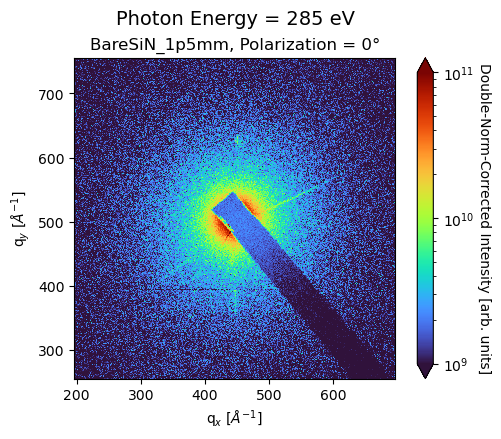

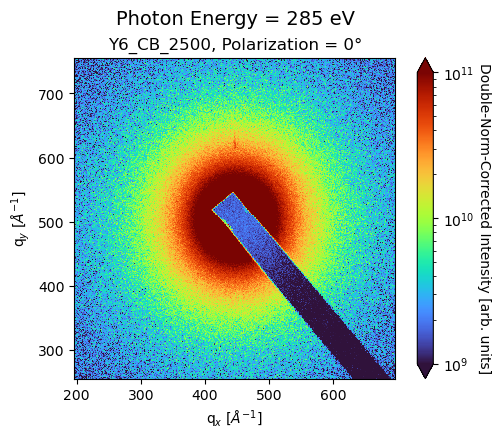

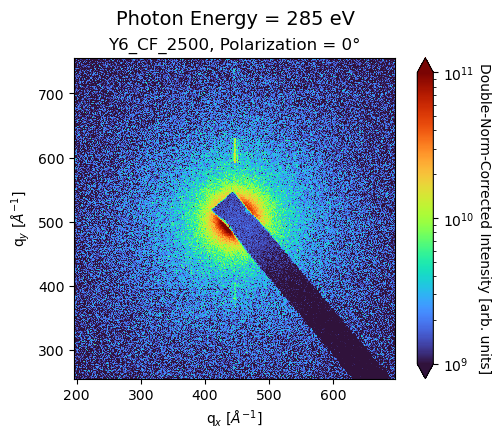

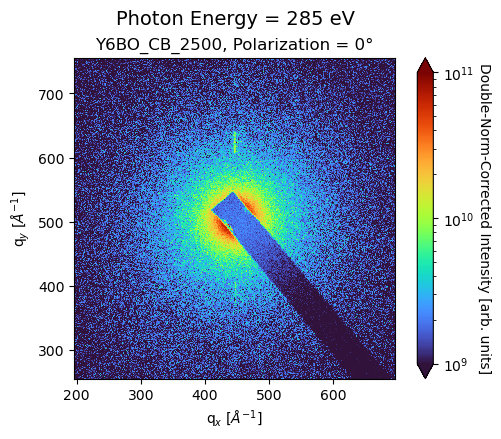

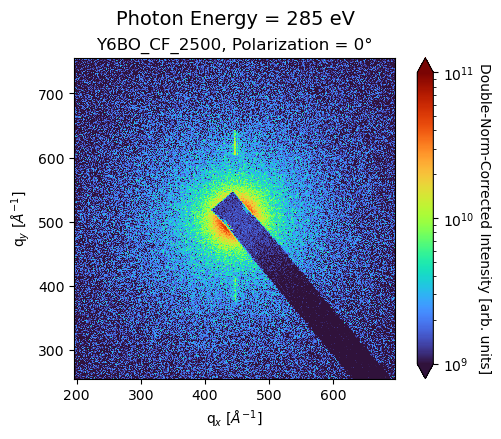

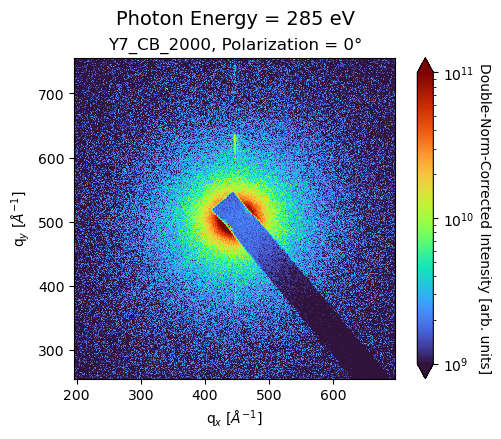

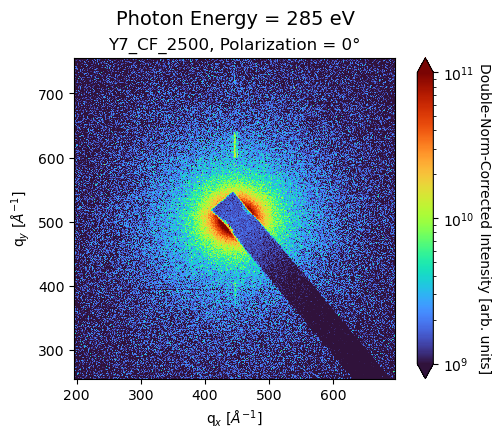

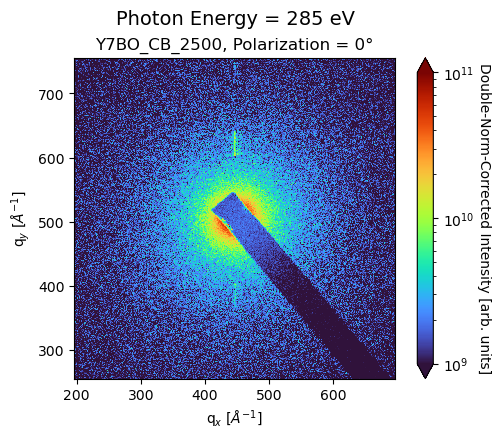

Pol = 90°:   0%|          | 0/8 [00:00<?, ?it/s]

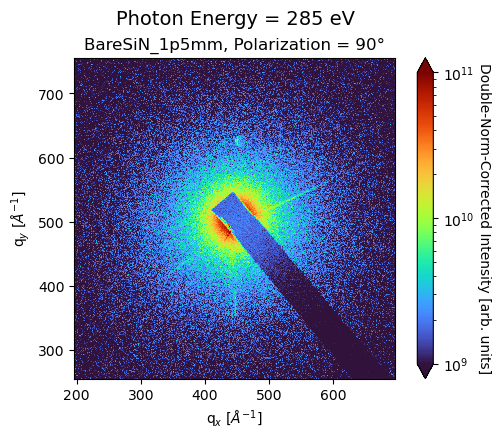

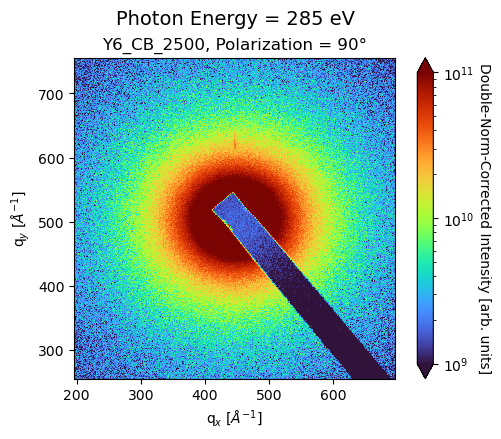

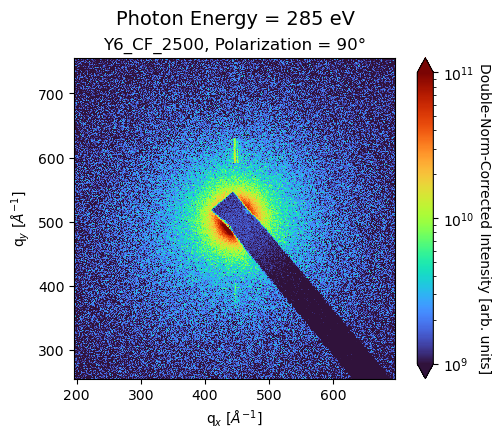

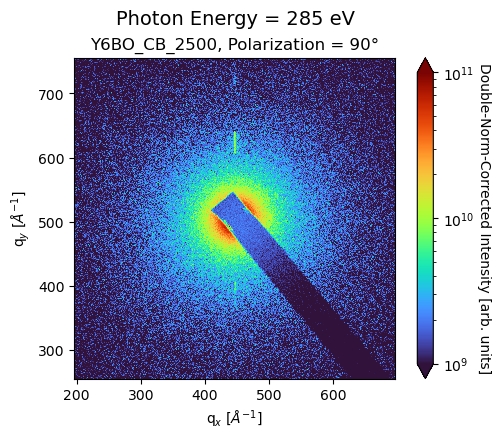

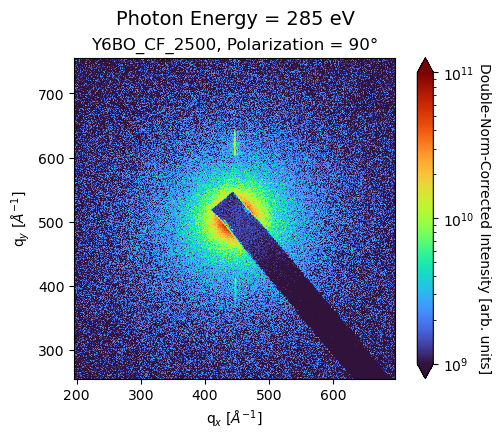

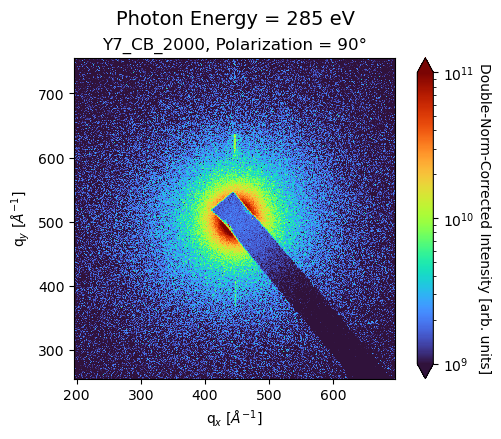

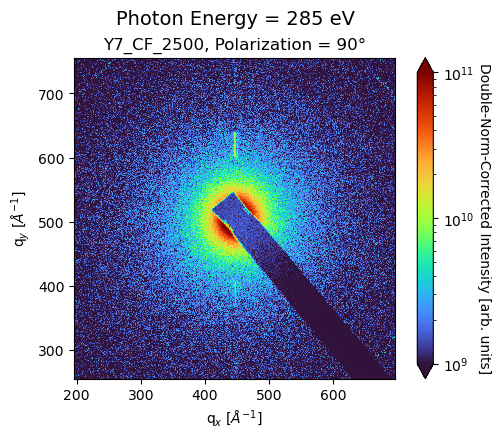

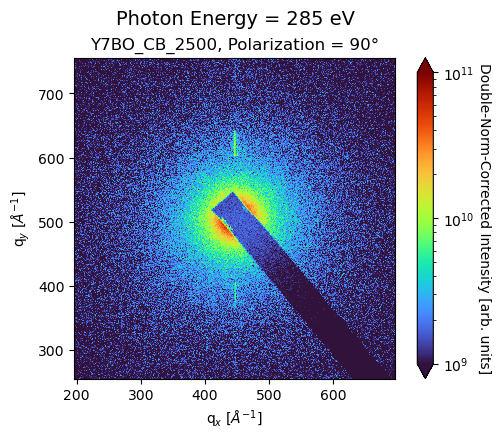

In [26]:
# Select Dataset
edge = 'carbon'
DS = rsoxs_datasets[f'cartesian_{edge}']
bcx = DS['raw_intensity'].beamcenter_x
bcy = DS['raw_intensity'].beamcenter_y


# Select Plotting Parameters
# pol = 90
energy = 285
# energy=400
pix_size = 500
pix_x_slice = slice(bcx-(pix_size/2), bcx+(pix_size/2))
pix_y_slice = slice(bcy-(pix_size/2), bcy+(pix_size/2))
cmin = 1e9
cmax = 1e11

# Select DataArray
# sample_name = 'PM6-Y6_3000_dSiN'
for pol in [0, 90]:
    for sample_name in tqdm(DS.sample_name.values, desc=f'Pol = {pol}°'):
        intensity_type = 'corr'
        DA = DS.sel(sample_name=sample_name)[f'{intensity_type}_intensity']
        # cmin = float(DA.where(sliced_DA>0).compute().quantile(0.35))
        # cmax = float(DA.where(sliced_DA>0).compute().quantile(0.9999))

        # Plot
        sliced_DA = DA.sel(polarization=pol, pix_x=pix_x_slice, pix_y=pix_y_slice).sel(energy=energy,method='nearest')
        # print(f'cmin={cmin}, cmax={cmax}')
        ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), x='pix_x', y='pix_y', cmap=cmap, norm=LogNorm(cmin,cmax))
        ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
        ax.figure.set_tight_layout(True)
        ax.axes.set(aspect='equal', title=f'{sample_name}, Polarization = {pol}°', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
        ax.colorbar.set_label('Double-Norm-Corrected Intensity [arb. units]', rotation=270, labelpad=12)
        # ax.figure.savefig(plotsPath.joinpath('detector_movies_carbon_v2', f'{sample_name}_{edge}_{intensity_type}_pol{pol}deg.jpeg'), dpi=120)
        plt.show()
        plt.close('all')

In [ ]:
plotsPath

In [ ]:
# Select Dataset
edge = 'carbon'
DS = rsoxs_datasets[f'cartesian_{edge}']
bcx = DS['raw_intensity'].beamcenter_x
bcy = DS['raw_intensity'].beamcenter_y

# Select Plotting Parameters
# pol = 90
pix_size = 500
pix_x_slice = slice(bcx-(pix_size/2), bcx+(pix_size/2))
pix_y_slice = slice(bcy-(pix_size/2), bcy+(pix_size/2))
intensity_type = 'corr'

# Select DataArray
# sample_name = 'PM6-Y6_3000_dSiN'
for pol in [0, 90]:
    for sample_name in tqdm(DS.sample_name.values[:1], desc=f'Polarization {pol}°'):
        DA = DS.sel(sample_name=sample_name)[f'{intensity_type}_intensity']

        output_path = plotsPath.joinpath('detector_movies_carbon_v2', f'{sample_name}_{edge}_{intensity_type}_pol{pol}deg.mp4')

        # FFmpeg command. This is set up to accept data from the pipe and use it as input, with PNG format.
        # It will then output an H.264 encoded MP4 video.
        cmd = [
            'ffmpeg',
            '-y',  # Overwrite output file if it exists
            '-f', 'image2pipe',
            '-vcodec', 'png',
            '-r', '23',  # Frame rate
            '-i', '-',  # The input comes from a pipe
            '-vcodec', 'libx264',
            '-pix_fmt', 'yuv420p',
            '-crf', '27',  # Set the quality (lower is better, 17 is often considered visually lossless)
            str(output_path)
        ]

        # Start the subprocess
        proc = subprocess.Popen(cmd, stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

        # Loop through the energy dimension and send frames to FFmpeg
        for energy in tqdm(DA.energy.values, desc=f'Making the {sample_name} movie'):
            # Make & customize plot
            sliced_DA = DA.sel(polarization=pol, pix_x=pix_x_slice, pix_y=pix_y_slice).sel(energy=energy, method='nearest')
            ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), x='qx', y='qy', cmap=cmap, norm=LogNorm(cmin,cmax))
            ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
            ax.figure.set_tight_layout(True)   
            ax.axes.set(aspect='equal', title=f'{sample_name}, Polarization = {pol}°', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
            ax.colorbar.set_label('Double-Norm-Corrected Intensity [arb. units]', rotation=270, labelpad=12)

            # Save figure to a PNG buffer
            # ax.figure.savefig(plotsPath.joinpath('detector_movies/frames', f'energy-{round(energy)}_frame-{i:03d}.png'), dpi=120)

            buf = io.BytesIO()
            ax.figure.savefig(buf, format='png')
            buf.seek(0)

            # Write the PNG buffer data to the process
            proc.stdin.write(buf.getvalue())
            plt.close('all')

        # Finish the subprocess
        out, err = proc.communicate()
        if proc.returncode != 0:
            print(f"Error: {err}")


### 2. ISI Plots

In [7]:
DA = rsoxs_datasets['polar_carbon']['corr_intensity']

In [8]:
DA.sample_name.values

array(['BareSiN_1p5mm', 'Y6_CB_2500', 'Y6_CF_2500', 'Y6BO_CB_2500',
       'Y6BO_CF_2500', 'Y7_CB_2000', 'Y7_CF_2500', 'Y7BO_CB_2500'],
      dtype=object)

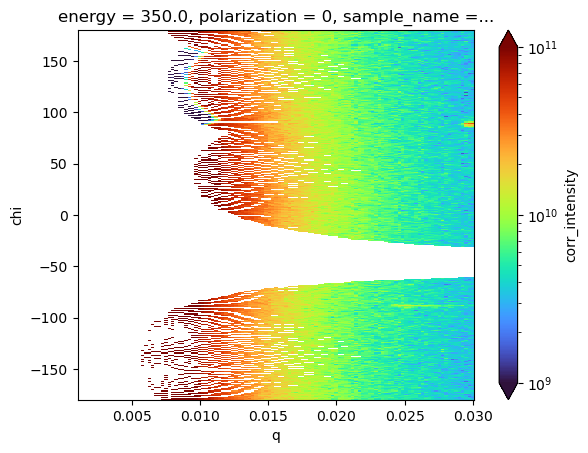

In [9]:
DA.sel(sample_name='Y6_CB_2500', polarization=0, q=slice(0.001, 0.03)).sel(energy=398.8, method='nearest').plot(norm=LogNorm(1e9, 1e11), cmap=plt.cm.turbo)
plt.show()

  0%|          | 0/8 [00:00<?, ?it/s]

/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/plot/utils.py:805: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale(yscale)
/srv/conda/envs/notebook/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  fig.canvas.print_figure(bytes_io, **kw)


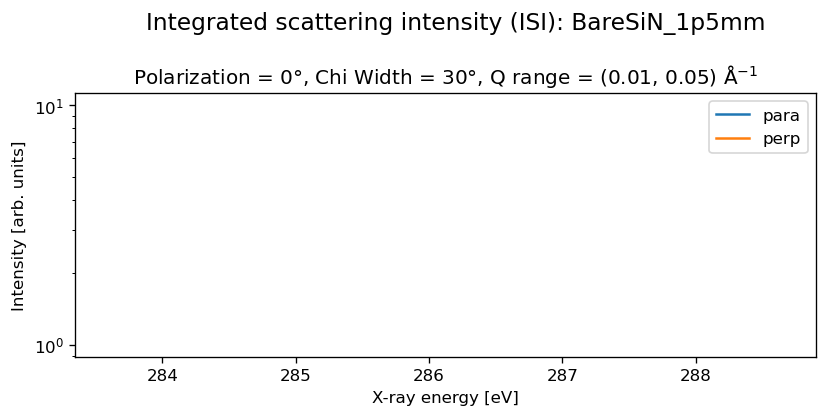

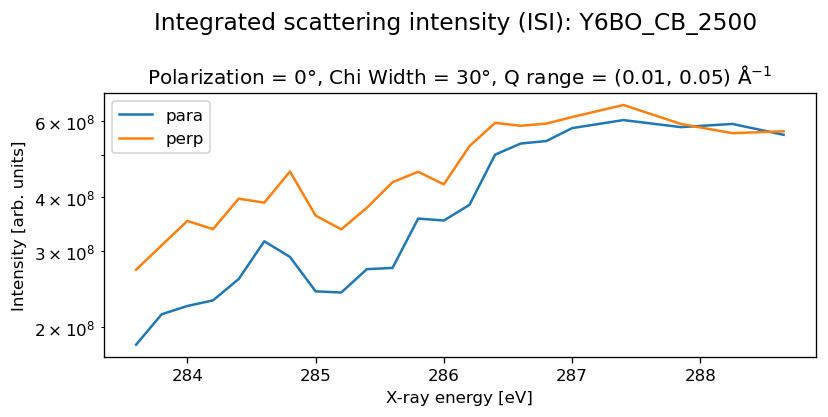

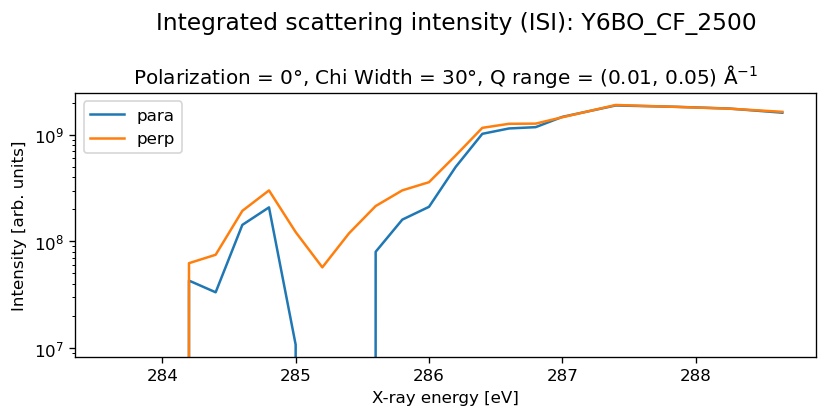

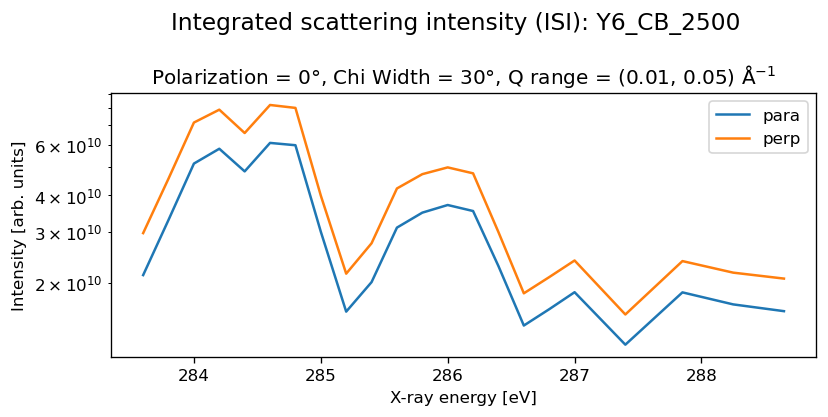

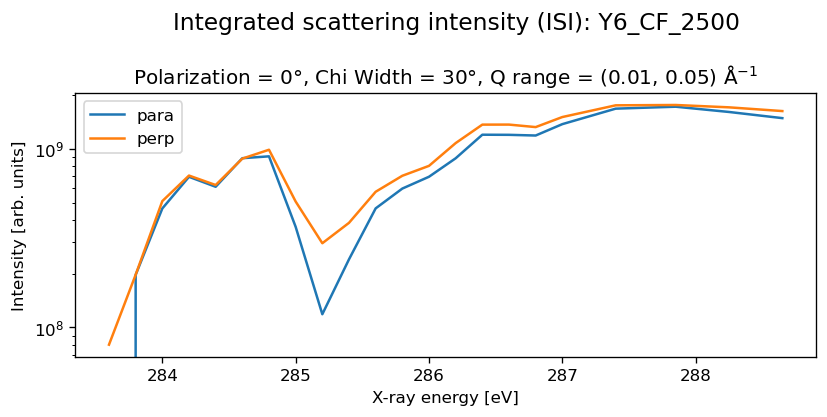

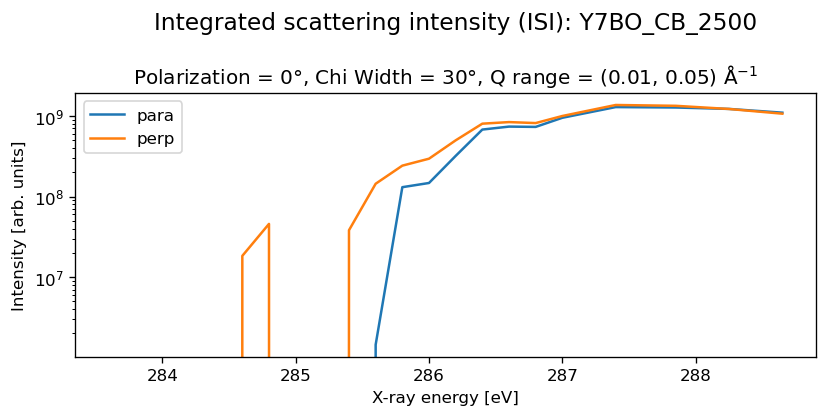

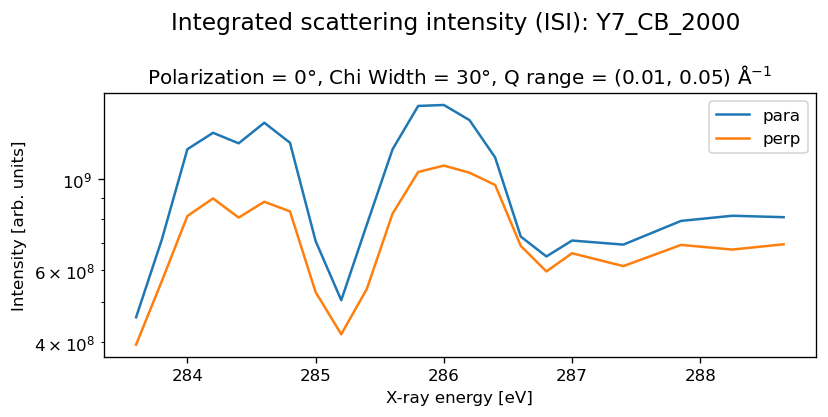

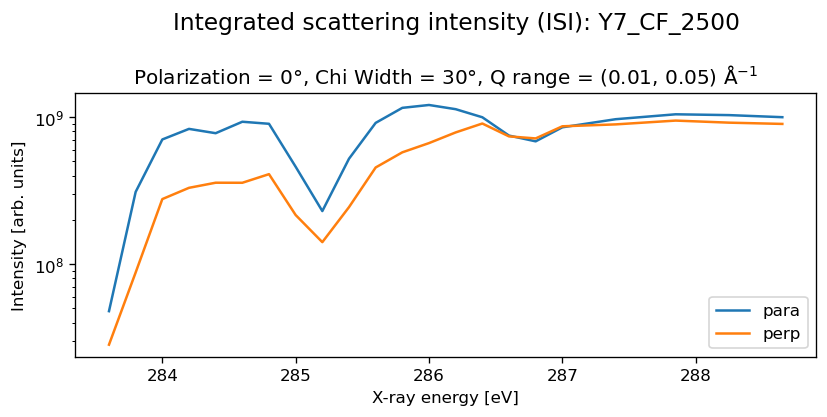

In [11]:
# make selection
# sample_name = 'PM6-Y6_3000_dSiN'
edge = 'carbon'
intensity_type = 'corr'
pol = 0
qlims = (0.01, 0.05)
chi_width = 30

energy_min = 283.5
energy_max = 289

for sample_name in tqdm(rsoxs_datasets[f'polar_{edge}'][f'{intensity_type}_intensity'].sortby('sample_name').sample_name.values):
    para_DA, perp_DA = make_para_perp_DAs(rsoxs_datasets, sample_name, edge, intensity_type, pol, qlims, chi_width)  
    sin_para_DA, sin_perp_DA = make_para_perp_DAs(rsoxs_datasets, 'BareSiN_1p5mm', edge, intensity_type, pol, qlims, chi_width)  

    para_DA = para_DA - sin_para_DA
    perp_DA = perp_DA - sin_perp_DA

    # slice ISI data
    para_ISI = para_DA.interpolate_na(dim='q').mean('chi').mean('q')
    perp_ISI = perp_DA.interpolate_na(dim='q').mean('chi').mean('q')

    # plot
    # fig, ax = plt.subplots()
    fig, ax = plt.subplots(figsize=(7,3.5), dpi=120, tight_layout=True)

    para_ISI.sel(energy=slice(energy_min,energy_max)).plot.line(ax=ax, label='para', yscale='log')
    perp_ISI.sel(energy=slice(energy_min,energy_max)).plot.line(ax=ax, label='perp', yscale='log')
    fig.suptitle(f'Integrated scattering intensity (ISI): {sample_name}', fontsize=14, x=0.55)
    ax.set(title=f'Polarization = {pol}°, Chi Width = {chi_width}°, Q range = ({qlims[0]}, {qlims[1]}) ' + 'Å$^{-1}$', 
           xlabel='X-ray energy [eV]', ylabel='Intensity [arb. units]')
    ax.legend()
    plt.show()

    # fig.savefig(outPath.joinpath('prsoxs_plots/isi_nitrogen_more_styles', 
    #     f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_qrange-{qlims[0]}-{qlims[1]}_pol{pol}deg.png'), dpi=120)

    # plt.close('all')

In [12]:
rsoxs_datasets[f'polar_{edge}'][f'{intensity_type}_intensity'].sample_name.values

array(['BareSiN_1p5mm', 'Y6_CB_2500', 'Y6_CF_2500', 'Y6BO_CB_2500',
       'Y6BO_CF_2500', 'Y7_CB_2000', 'Y7_CF_2500', 'Y7BO_CB_2500'],
      dtype=object)

In [328]:
selected_samples = ['Y6_3000_dSiN', 'PM6_3000_dSiN', 'PM6-Y6_3000_dSiN', 'PM7-Y6_3000_dSiN', 'Y7_3000_dSiN', 'PM7_3000_dSiN', 'PM7-Y7_3000_dSiN']
# selected_samples = ['Y6_3000_dSiN', 'PM6_3000_dSiN', 'PM6-Y6_3000_dSiN', 'PM7-Y6_3000_dSiN', 'Y7_3000_dSiN', 'PM7_3000_dSiN', 'PM7-Y7_3000_dSiN']

In [356]:
rsoxs_datasets['polar_nitrogen']['corr_intensity'].sel(sample_name=selected_samples)

<xarray.DataArray 'corr_intensity' (sample_name: 7, polarization: 2,
                                    energy: 57, chi: 360, q: 500)>
dask.array<getitem, shape=(7, 2, 57, 360, 500), dtype=float64, chunksize=(1, 1, 5, 360, 500), chunktype=numpy.ndarray>
Coordinates:
  * chi           (chi) float64 -179.5 -178.5 -177.5 ... 177.4 178.4 179.4
  * energy        (energy) float64 380.0 382.9 385.6 388.5 ... 434.5 437.2 440.0
  * polarization  (polarization) int64 0 90
  * q             (q) float64 0.0002036 0.0005482 0.0008929 ... 0.1719 0.1722
  * sample_name   (sample_name) object 'Y6_3000_dSiN' ... 'PM7-Y7_3000_dSiN'

  0%|          | 0/7 [00:00<?, ?it/s]

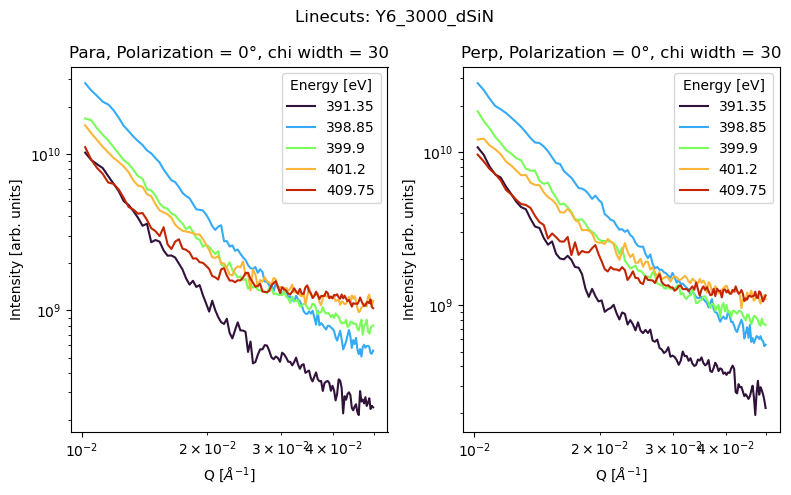

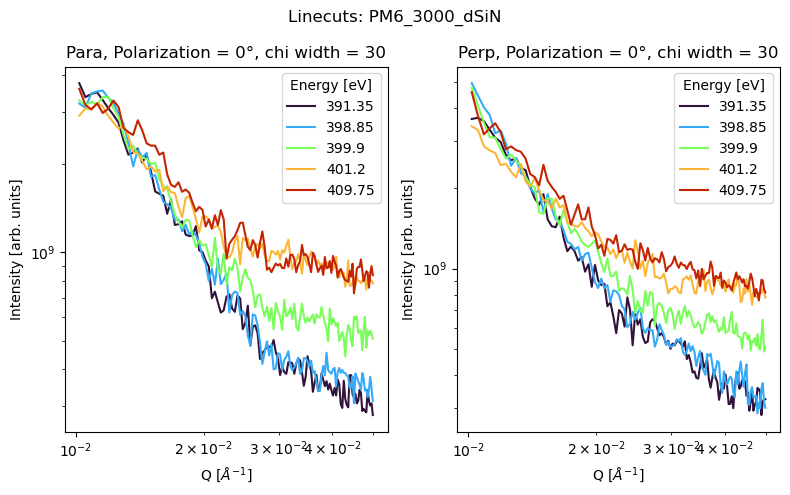

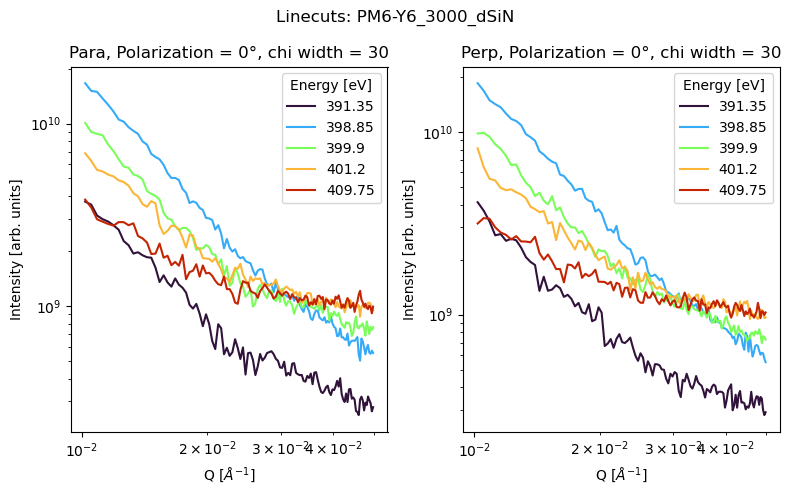

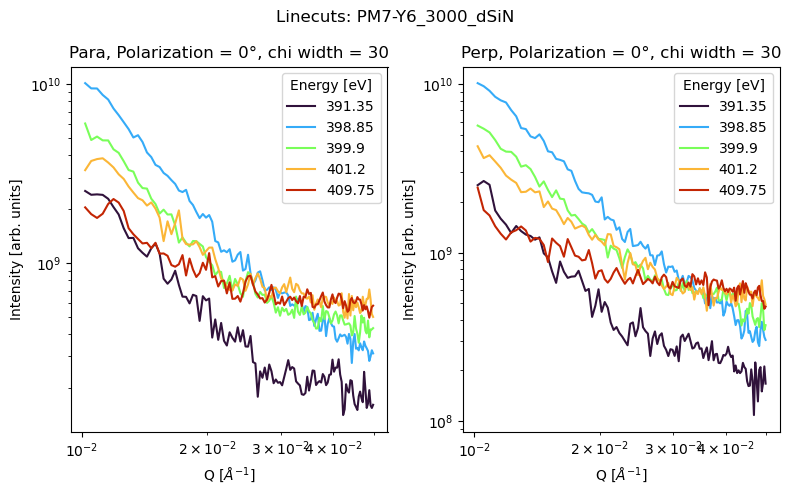

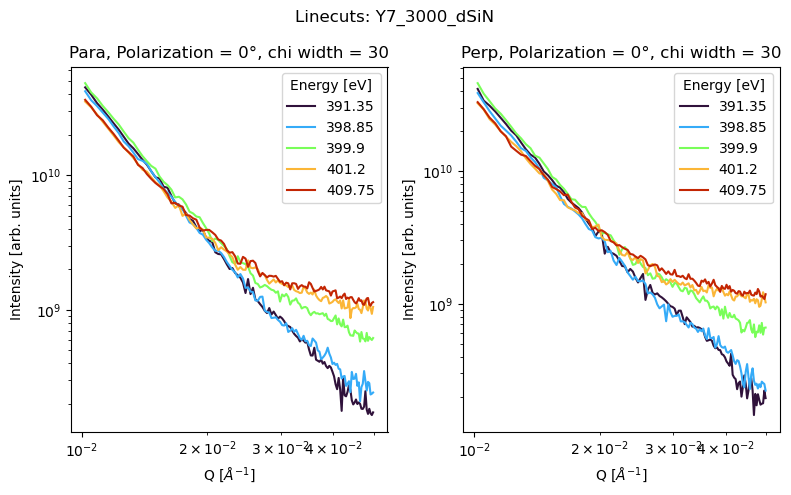

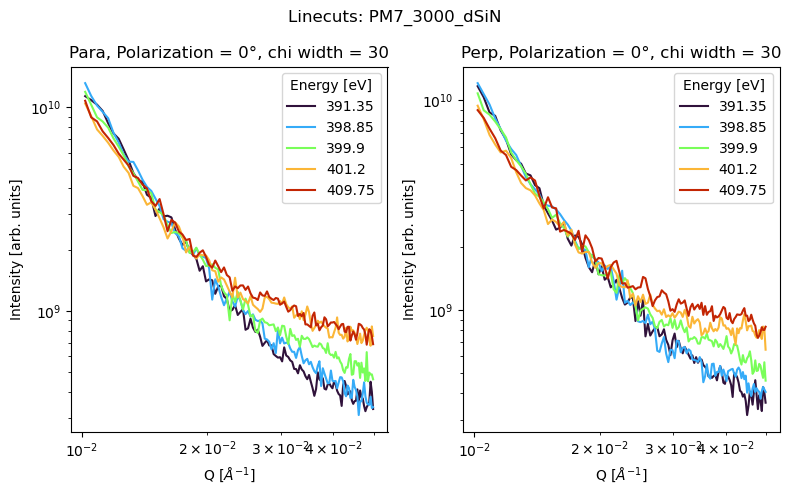

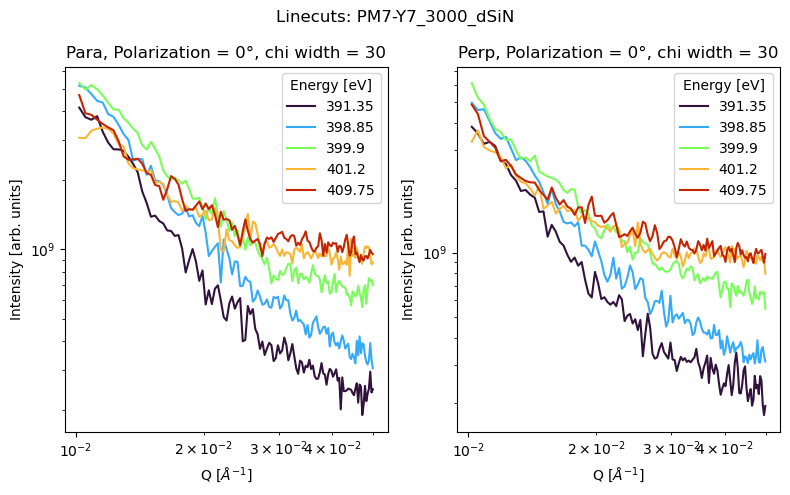

In [360]:
# make selection
# sample_name = 'PM6-Y7_3000_dSiN'
edge = 'nitrogen'
intensity_type = 'corr'
# pol = 0
qlims = (0.01, 0.05)
chi_width = 30


# for sample_name in tqdm(rsoxs_datasets[f'polar_{edge}'][f'{intensity_type}_intensity'].sample_name.values):
for sample_name in tqdm(selected_samples):
    for pol in [0]:
        para_DA, perp_DA = make_para_perp_DAs(rsoxs_datasets, sample_name, edge, intensity_type, pol, qlims, chi_width)  
        sin_para_DA, sin_perp_DA = make_para_perp_DAs(rsoxs_datasets, 'BareSiN', edge, intensity_type, pol, qlims, chi_width)  

        para_DA = para_DA - sin_para_DA  # use for nitrogen
        perp_DA = perp_DA - sin_perp_DA  # use for nitrogen

        # energies = para_DA.energy.sel(energy=slice(398.4, 401.5)).data
        # energies = para_DA.energy.sel(energy=slice(390, 404)).data
        energies = para_DA.energy.sel(energy=[390, 398.8, 399.8, 401.1, 410], method='nearest').data
        # energies = para_DA.energy.sel(energy=[283, 284.2, 284.4, 284.8, 285.1, 285.8, 286.2, 287, 288, 300], method='nearest').data
        # energies = para_DA.energy.sel(energy=[283, 284.2, 284.8, 285.1, 286.2, 287, 288, 300], method='nearest').data
        # energies = para_DA.energy.sel(energy=[283, 284.2, 284.4, 284.8, 285.1, 285.8, 286.2, 287, 288, 300], method='nearest').data

        
        cmap = plt.cm.turbo.copy()
        colors = cmap(np.linspace(0, 0.9, len(energies)))

        # # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
        # sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=energies[0], vmax=energies[-1]))
        # cax = ax.inset_axes([1.03, 0, 0.03, 1])
        # cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
        # cbar.set_label(label=f'Time [seconds]', labelpad=14)
        # cbar.set_ticks(np.round(np.linspace(energies[0], energies[-1], len(energies)), 2))

        fig, axs = plt.subplots(ncols=2,figsize=(8,5), tight_layout=True)

        for j, energy in enumerate(energies):
            (para_DA.sel(q=slice(None, 5e-2), energy=energy).interpolate_na(dim='q').mean('chi')
             .plot.line(ax=axs[0], color=colors[j], yscale='log', xscale='log', label=energy))
            (perp_DA.sel(q=slice(None, 5e-2), energy=energy).interpolate_na(dim='q').mean('chi')
             .plot.line(ax=axs[1], color=colors[j], yscale='log', xscale='log', label=energy))

        fig.suptitle(f'Linecuts: {sample_name}')
        axs[0].set(title=f'Para, Polarization = {pol}°, chi width = {chi_width}', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
        axs[1].set(title=f'Perp, Polarization = {pol}°, chi width = {chi_width}', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')

        axs[0].legend(title='Energy [eV]')
        axs[1].legend(title='Energy [eV]')
        
        fig.savefig(plotsPath.joinpath('selected_linecuts_xylog', 
            f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_q{qlims[0]}-{qlims[1]}_pol{pol}deg.png'), dpi=120)

        plt.show()
        plt.close('all')

In [362]:
(2*np.pi)/0.08

78.53981633974483

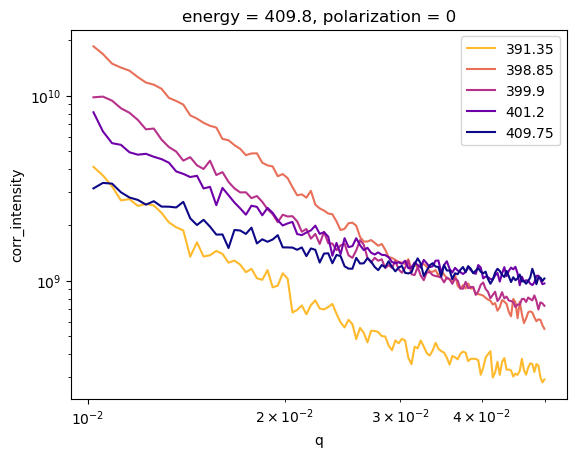

In [205]:
# energies = para_DA.energy.sel(energy=slice(398.4, 401.5)).data
# energies = para_DA.energy.sel(energy=slice(390, 404)).data
energies = para_DA.energy.sel(energy=[390, 398.8, 399.8, 401.1, 410], method='nearest').data



cmap = plt.cm.plasma_r.copy()
colors = cmap(np.linspace(0.15, 1, len(energies)))

fig, ax = plt.subplots()

# # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=energies[0], vmax=energies[-1]))
# cax = ax.inset_axes([1.03, 0, 0.03, 1])
# cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
# cbar.set_label(label=f'Time [seconds]', labelpad=14)
# cbar.set_ticks(np.round(np.linspace(energies[0], energies[-1], len(energies)), 2))


for i, energy in enumerate(energies):
    (perp_DA.sel(q=slice(None, 5e-2), energy=energy).interpolate_na(dim='q').mean('chi')
     .plot.line(ax=ax, color=colors[i], yscale='log', xscale='log', label=energy))

plt.legend()
plt.show()

### 3. 2D Linecut Maps

In [ ]:
display(DS.sample_name.values)

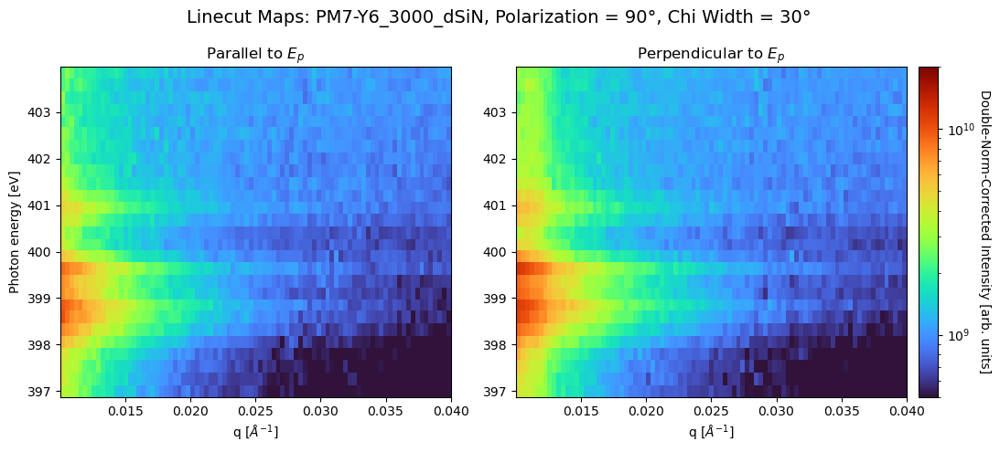

In [282]:
# make selection
sample_name = 'PM7-Y6_3000_dSiN'
edge = 'nitrogen'
intensity_type = 'corr'
pol = 90
qlims = (0.01, 0.04)
chi_width = 30
energy_min = 396
energy_max = 404

cmap = plt.cm.turbo.copy()

para_DA, perp_DA = make_para_perp_DAs(rsoxs_datasets, sample_name, edge, intensity_type, pol, qlims, chi_width)  

# Plot
fig, axs = plt.subplots(1, 2, figsize=(11,5))
cmin = 5e8
cmax = 2e10

# para_DA.sum('chi').sel(energy=slice(282,290)).plot(ax=axs[0], cmap=cmap, norm=LogNorm(2e10, 1e12), add_colorbar=False)
# perp_DA.sum('chi').sel(energy=slice(282,290)).plot(ax=axs[1], cmap=cmap, norm=LogNorm(2e10, 1e12), add_colorbar=False)
para_DA.mean('chi').sel(energy=slice(energy_min,energy_max)).plot(ax=axs[0], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
perp_DA.mean('chi').sel(energy=slice(energy_min,energy_max)).plot(ax=axs[1], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
# para_DA.mean('chi').sel(energy=slice(525,540)).plot(ax=axs[0], cmap=cmap, norm=LogNorm(1e9, 1e11), add_colorbar=False)
# perp_DA.mean('chi').sel(energy=slice(525,540)).plot(ax=axs[1], cmap=cmap, norm=LogNorm(1e9, 1e11), add_colorbar=False)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(cmin, cmax)) # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
cax = axs[1].inset_axes([1.03, 0, 0.05, 1])
cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
cbar.set_label(label='Double-Norm-Corrected Intensity [arb. units]', labelpad=12, rotation=270)

fig.suptitle(f'Linecut Maps: {sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', fontsize=14)
fig.set(tight_layout=True)

axs[0].set(title='Parallel to $E_p$', ylabel='Photon energy [eV]', xlabel='q [$Å^{-1}$]')
axs[1].set(title='Perpendicular to $E_p$ ', ylabel=None, xlabel='q [$Å^{-1}$]')

plt.show()

In [ ]:
a = para_EvsQ_avg.hvplot.line(groupby="energy", loglog=True)
a * perp_EvsQ_avg.hvplot.line(groupby="energy")

### 4. Meaned 1D intensity lineplots, selected energies

In [ ]:
# make selection
sample_name = 'PM6-Y6_3000_dSiN'
edge = 'carbon'
intensity = 'corr'
pol = 0
qlims = (0.01, 0.08)
chi_width = 30

para_DA, perp_DA = make_para_perp_DAs(rsoxs_datasets, sample_name, edge, intensity_type, pol, qlims, chi_width)  

# Plot
# energies = [275, 280, 283, 285.1, 286.3, 300, 340]
energies = [285.1, 285.4, 286.3, 287, 288, 289, 290, 295]
fig, (ax_para, ax_perp) = plt.subplots(1,2)
fig.set(size_inches=(10,4))
fig.suptitle(f'Intensity vs. Q for selected energies, chi widths = {chi_width}°', fontsize=14, y = 1.02)
hue = plt.cm.viridis_r(np.linspace(0, 1, len(energies)))
for i, energy in enumerate(energies):
    para_DA.mean('chi').sel(energy=energy, method='nearest').plot.line(
        ax=ax_para, xscale='log', yscale='log', color=hue[i], label=f'{energy} eV')
    perp_DA.mean('chi').sel(energy=energy, method='nearest').plot.line(
        ax=ax_perp, xscale='log', yscale='log', color=hue[i], label=f'{energy} eV')

    
ax_perp.legend()
ax_para.set(title='Parallel to $E_p$', ylabel='Intensity [arb. units]', xlabel='q [$Å^{-1}$]')
ax_perp.set(title='Perpendicular to $E_p$', ylabel=None, xlabel='q [$Å^{-1}$]')

plt.show()

## Anisotropy Ratio Plots

### 1. 2D AR Maps

In [247]:
rsoxs_datasets.keys()

dict_keys(['cartesian_carbon', 'cartesian_nitrogen', 'cartesian_oxygen', 'polar_carbon', 'polar_nitrogen', 'polar_oxygen'])

In [13]:
rsoxs_datasets['polar_nitrogen'].sample_name.values

array(['BareSiN_1p5mm', 'Y6_CB_2500', 'Y6_CF_2500', 'Y6BO_CB_2500',
       'Y6BO_CF_2500', 'Y7_CB_2000', 'Y7_CF_2500', 'Y7BO_CB_2500'],
      dtype=object)

In [289]:
plotsPath

PosixPath('/nsls2/data/sst/proposals/2023-2/pass-311130/processed_data/prsoxs_plots')

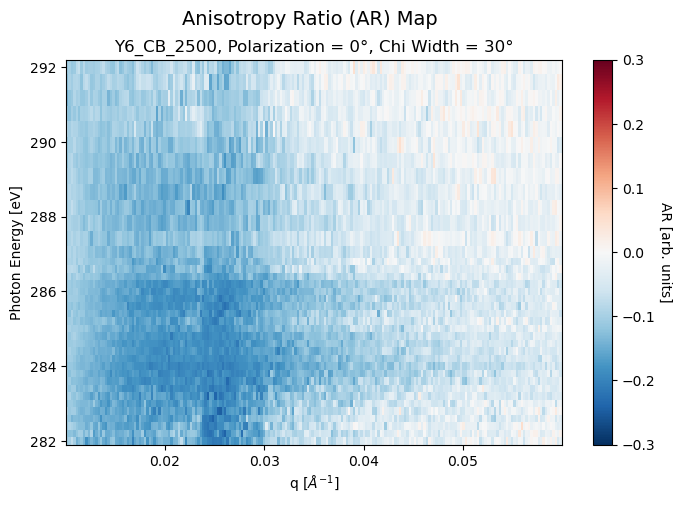

In [18]:
# make selection
sample_name = 'Y6_CB_2500'
edge = 'carbon'
intensity_type = 'corr'
pol = 0
qlims = (0.01, 0.06)
chi_width = 30
energy_min = 282
energy_max = 292

para_DA, perp_DA = make_para_perp_DAs(rsoxs_datasets, sample_name, edge, intensity_type, pol, qlims, chi_width)   

# Select AR data
ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

# Plot
ax = ar_DA.sel(energy=slice(energy_min,energy_max)).plot(figsize=(8,5), norm=plt.Normalize(-0.3, 0.3))
# ax = ar_DA.sel(energy=slice(energy_min,energy_max)).plot(figsize=(8,5))

ax.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
ax.axes.set(title=f'{sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', ylabel='Photon Energy [eV]', xlabel='q [$Å^{-1}$]')
ax.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)


# ax.figure.savefig(plotsPath.joinpath('ar_maps_nitrogen_more', 
#     f'vminned_{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_q-{qlims[0]}-{qlims[1]}_energy{energy_min}-{energy_max}_pol{pol}deg.png'), 
#                   dpi=120)

plt.show()

In [ ]:
ARvsQ_avg.hvplot.line(groupby="energy")

### 2. 1D AR Maps

## Loop for saving many plots

In [ ]:
rsoxs_datasets['polar_oxygen']

In [ ]:
# make selection
edge = 'oxygen'
intensity_type = 'corr'
qlims = (0.01, 0.08)
chi_width = 30
energy_min = 525
energy_max = 545
cmin = 5e8
cmax = 5e10

for sample_name in tqdm(rsoxs_datasets[f'polar_{edge}'].sample_name.data):
    for pol in [0, 90]:
        ### Select para & perp DataArrays
        para_DA, perp_DA = make_para_perp_DAs(rsoxs_datasets, sample_name, edge, intensity_type, pol, qlims, chi_width)  
        
        ### ISI:
        # Slice ISI data
        para_ISI = para_DA.interpolate_na(dim='q').mean('chi').sum('q')
        perp_ISI = perp_DA.interpolate_na(dim='q').mean('chi').sum('q')
        
        # Plot
        fig, ax = plt.subplots()
        para_ISI.sel(energy=slice(energy_min,energy_max)).plot.line(ax=ax, label='para', yscale='log')
        perp_ISI.sel(energy=slice(energy_min,energy_max)).plot.line(ax=ax, label='perp', yscale='log')
        # para_ISI.plot.line(ax=ax, label='para', yscale='log')
        # perp_ISI.plot.line(ax=ax, label='perp', yscale='log')        
        fig.suptitle('Integrated Scattering Intensity (ISI)', fontsize=14)
        ax.set(title=f'{sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', xlabel='Photon Energy [eV]', ylabel='Double-Norm-Corrected Intensity [arb. units]')
        ax.legend()
        fig.savefig(plotsPath.joinpath('isi_oxygen_v1', f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_pol{pol}deg.png'), dpi=120)
        # plt.show()
        plt.close('all')
        
        ### Linecut Maps:
        fig, axs = plt.subplots(1, 2, figsize=(11,5))

        para_DA.mean('chi').sel(energy=slice(energy_min,energy_max)).plot(ax=axs[0], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
        perp_DA.mean('chi').sel(energy=slice(energy_min,energy_max)).plot(ax=axs[1], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)

        sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(cmin, cmax)) # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
        cax = axs[1].inset_axes([1.03, 0, 0.05, 1])
        cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
        cbar.set_label(label='Intensity [arb. units]', labelpad=12)
        fig.suptitle(f'Linecut Maps: {sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', fontsize=14)
        fig.set(tight_layout=True)
        axs[0].set(title='Parallel to $E_p$', ylabel='Photon energy [eV]', xlabel='q [$Å^{-1}$]')
        axs[1].set(title='Perpendicular to $E_p$ ', ylabel=None, xlabel='q [$Å^{-1}$]')
        fig.savefig(plotsPath.joinpath('linecut_maps_oxygen_v1', f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_pol{pol}deg.png'), dpi=120)
        # plt.show()
        plt.close('all')

        ### AR Maps:
        # Select AR data
        ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

        if para_DA.sample_name=='BareSiN':
            bareSiN_ar_DA = ar_DA.copy()
            
        # # Subtract AR from SiN:
        # ar_DA = ar_DA - bareSiN_ar_DA

        # Plot
        ax = ar_DA.sel(energy=slice(energy_min,energy_max)).plot(figsize=(8,5), norm=plt.Normalize(-0.6, 0.6))
        ax.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
        ax.axes.set(title=f'{sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', ylabel='Photon Energy [eV]', xlabel='q [$Å^{-1}$]')
        ax.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)
        ax.figure.savefig(plotsPath.joinpath('ar_maps_oxygen_v1', f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_pol{pol}deg.png'), dpi=120)
        # plt.show()
        plt.close('all')

## Incorporating simulation output
old and incomplete

In [ ]:
import h5py

In [ ]:
whos PosixPath

In [ ]:
simsPath = rootPath.joinpath('imgs_analysis/sim_runs')

In [ ]:
[f.name for f in simPath.iterdir()]

In [ ]:
simPath = simsPath.joinpath('D1.0_a1.0_eps1.0_250pix_375size_0.5m_600steps_1')
h5path = simPath.joinpath('HDF5')
h5list = sorted(h5path.glob('E*h5'))

In [ ]:
def print_key(f, key):
    try:
        keys2 = f[key].keys()
        for key2 in keys2:
            new_key = key + '/' + key2
            print_key(f, new_key)
    except AttributeError:
        print(key)

with h5py.File(h5list[0],'r') as f:
    for key in f.keys():
        print_key(f, key)

#### The scattering pattern is contained within 'K0/projection.' If you simulated multiple incident angles there would be additional 'K#' keys. KIDList contains the vector values for each of the incident angles (propagation direction).

#### Instantiate the PyHyperScattering loader and integrator

In [ ]:
load = phs.load.cyrsoxsLoader(use_chunked_loading=True)
integ = phs.integrate.WPIntegrator(force_np_backend=True) # avoiding gpu backend for this tutorial

In [ ]:
raw = load.loadDirectory(simPath)

In [ ]:
raw

In [ ]:
remeshed = integ.integrateImageStack(raw)

In [ ]:
remeshed

In [ ]:
remeshed.sel(energy=285.1).plot()

In [ ]:
# c = cm.jet(np.linspace(0,1,len(remeshed)))

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(10,3),dpi=140,constrained_layout=True)
raw.sel(energy=275).plot(norm=LogNorm(1e-7,1),cmap='terrain',ax=ax[0],add_colorbar=False)
raw.sel(energy=285).plot(norm=LogNorm(1e-7,1),cmap='terrain',ax=ax[1],add_colorbar=False)
raw.sel(energy=295).plot(norm=LogNorm(1e-7,1),cmap='terrain',ax=ax[2])

[{axes.set_xlim(-0.1,0.1),axes.set_ylim(-0.1,0.1)} for axes in ax]
plt.show()

In [ ]:
loaded_rsoxs.build_tiff_stack??